# <u>Deepfake Video Detection Project</u>

<pre>Name: THIRUVEEDULA BALAJI KARTHEEK           Reg No.: 200968080</pre>
in collabaration with :<pre>Name: AARON DSOUZA                           Reg No.: 200968008</pre>

In [4]:
# Importing Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os 
import cv2 as cv
import glob


A module that was compiled using NumPy 1.x cannot be run in
NumPy 2.0.2 as it may crash. To support both 1.x and 2.x
versions of NumPy, modules must be compiled with NumPy 2.0.
Some module may need to rebuild instead e.g. with 'pybind11>=2.12'.

If you are a user of the module, the easiest solution will be to
downgrade to 'numpy<2' or try to upgrade the affected module.
We expect that some modules will need time to support NumPy 2.

Traceback (most recent call last):  File "c:\Users\menon\.conda\envs\DeepFake-Detection\lib\runpy.py", line 197, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\menon\.conda\envs\DeepFake-Detection\lib\runpy.py", line 87, in _run_code
    exec(code, run_globals)
  File "c:\Users\menon\.conda\envs\DeepFake-Detection\lib\site-packages\ipykernel_launcher.py", line 18, in <module>
    app.launch_new_instance()
  File "c:\Users\menon\.conda\envs\DeepFake-Detection\lib\site-packages\traitlets\config\application.py", line 10

AttributeError: _ARRAY_API not found

## MetaData of the DataSet


In [5]:
train_sample_metadata = pd.read_json(r"C:\Users\menon\Codes\DeepFake_Detection\Dataset\train_sample_videos\metadata.json").T
train_sample_metadata.head()

,label,split,original
aagfhgtpmv.mp4,FAKE,train,vudstovrck.mp4
aapnvogymq.mp4,FAKE,train,jdubbvfswz.mp4
abarnvbtwb.mp4,REAL,train,None
abofeumbvv.mp4,FAKE,train,atvmxvwyns.mp4
abqwwspghj.mp4,FAKE,train,qzimuostzz.mp4


- Index is the Name of the Video
- Label represents the type of video it is.
 - if the label is Fake orginal column contains its orginal video name else it is None


In [6]:
train_sample_metadata.info()

<class 'pandas.core.frame.DataFrame'>
Index: 400 entries, aagfhgtpmv.mp4 to eukvucdetx.mp4
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   label     400 non-null    object
 1   split     400 non-null    object
 2   original  323 non-null    object
dtypes: object(3)
memory usage: 28.7+ KB


In [7]:
train_sample_metadata['label'].value_counts()

label
FAKE    323
REAL     77
Name: count, dtype: int64

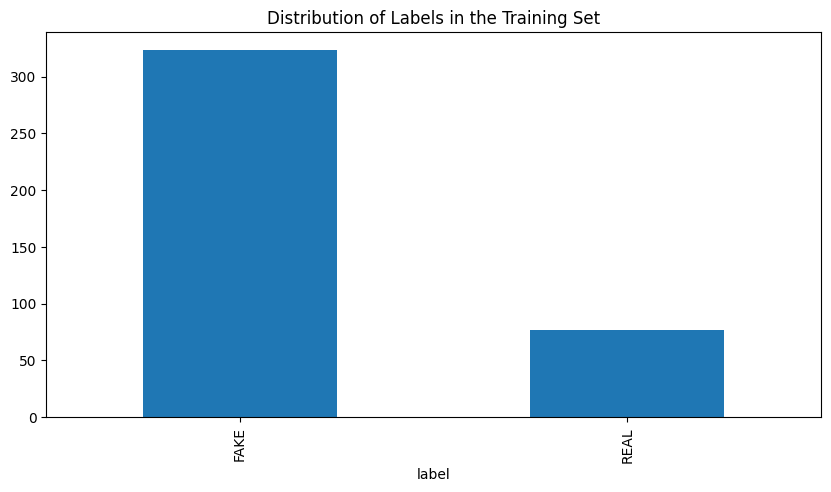

In [8]:
train_sample_metadata.groupby('label')['label'].count().plot(figsize=(10, 5), kind='bar', title='Distribution of Labels in the Training Set')
plt.show()

Unique Values 

In [9]:
def unique_values(data):
    total = data.count()
    tt = pd.DataFrame(total)
    tt.columns = ['Total']
    uniques = []
    for col in data.columns:
        unique = data[col].nunique()
        uniques.append(unique)
    tt['Uniques'] = uniques
    return(np.transpose(tt))

In [10]:
unique_values(train_sample_metadata)

,label,split,original
Total,400,400,323
Uniques,2,1,209


- Uniquess of label =2 tells that there are 2 unique values("FAKE", "REAL" )
- Uniquess of original =209 tells that there are 209 unique video names in the train_sample_metadata dataframe

### Most Frequent items

In [11]:
def most_frequent_values(data):
    total = data.count()
    tt = pd.DataFrame(total)
    tt.columns = ['Total']
    items = []
    vals = []
    for col in data.columns:
        itm = data[col].value_counts().index[0]
        val = data[col].value_counts().values[0]
        items.append(itm)
        vals.append(val)
    tt['Most frequent item'] = items
    tt['Frequency'] = vals
    tt['Percent from total'] = np.round(vals / total * 100, 3)
    return(np.transpose(tt))


In [12]:
most_frequent_values(train_sample_metadata)

,label,split,original
Total,400,400,323
Most frequent item,FAKE,train,atvmxvwyns.mp4
Frequency,323,400,6
Percent from total,80.75,100.0,1.858


- FAKE label is the most frequently occuring item in label column with percentage of 80.75%
- which indicates REAL label is occuring with percentage of 19.25%
- atvmxvwyns.mp4 is the most frequently occuring video

In [13]:
original_counts = pd.DataFrame(train_sample_metadata['original'].value_counts())
original_counts.head(10)

,count
original,
atvmxvwyns.mp4,6
meawmsgiti.mp4,6
kgbkktcjxf.mp4,5
qeumxirsme.mp4,5
fysyrqfguw.mp4,4
gbqrgajyca.mp4,4
qzklcjjxdq.mp4,4
qtnjyomzwo.mp4,4
dzyuwjkjui.mp4,4


### some of the Fake Video names

In [14]:
fake_train_sample_video = list(train_sample_metadata.loc[train_sample_metadata.label=='FAKE'].sample(10).index)
fake_train_sample_video

['esgftaficx.mp4',
 'dzwkmcwkwl.mp4',
 'elginszwtk.mp4',
 'avtycwsgyb.mp4',
 'egbbcxcuqy.mp4',
 'byyqectxqa.mp4',
 'duzuusuajr.mp4',
 'ehieahnhte.mp4',
 'andaxzscny.mp4',
 'dnhvalzvrt.mp4']

### some of the REAL Video names

In [15]:
real_train_sample_video = list(train_sample_metadata.loc[train_sample_metadata.label=='REAL'].sample(10).index)    # returning the index value which is video name
real_train_sample_video

['clrycekyst.mp4',
 'aelfnikyqj.mp4',
 'axntxmycwd.mp4',
 'bwhlgysghg.mp4',
 'ajqslcypsw.mp4',
 'djxdyjopjd.mp4',
 'cyxlcuyznd.mp4',
 'aytzyidmgs.mp4',
 'bzythlfnhq.mp4',
 'agrmhtjdlk.mp4']

### Function to display the image from the video

In [16]:
def display_image_from_video(video_path):
    '''
    input: video_path - path for video
    process:
    1. perform a video capture from the video
    2. read the image
    3. display the image
    '''
    capture_image = cv.VideoCapture(video_path) 
    ret, frame = capture_image.read()
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111)
    frame = cv.cvtColor(frame, cv.COLOR_BGR2RGB)   # converting the frame color to RGB
    ax.imshow(frame)
    

## Fake Video Images

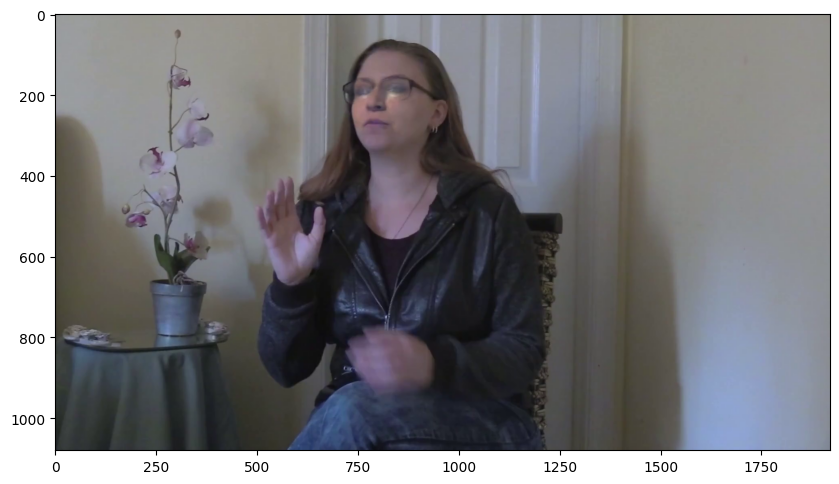

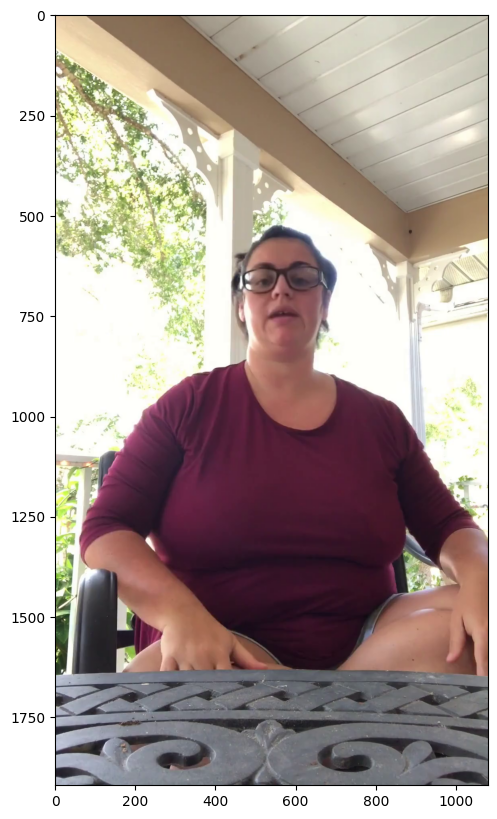

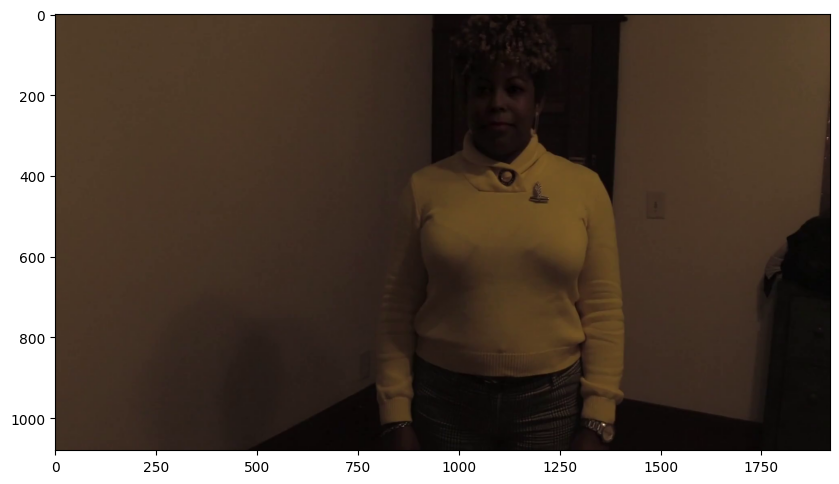

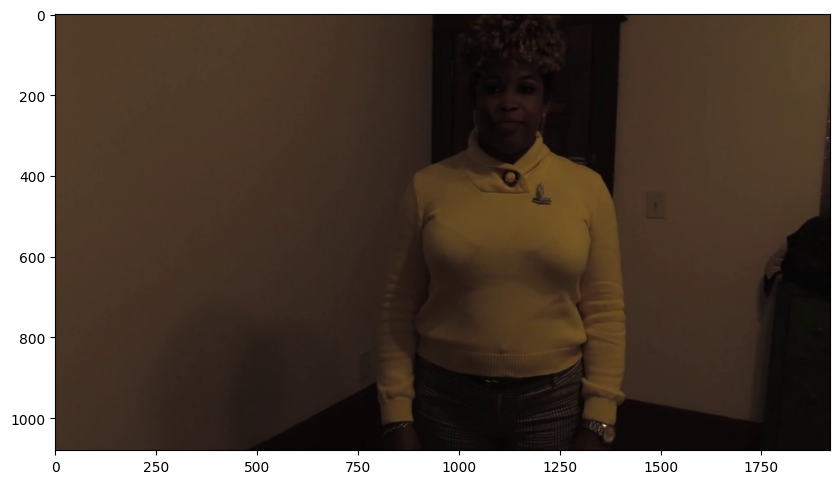

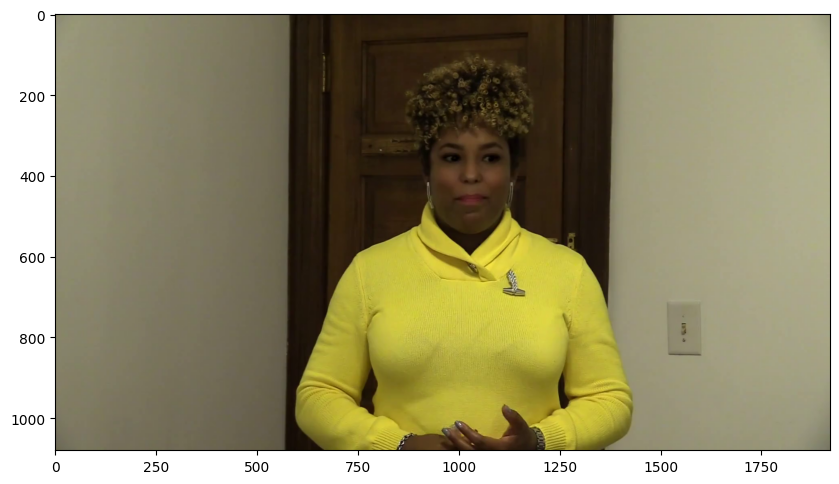

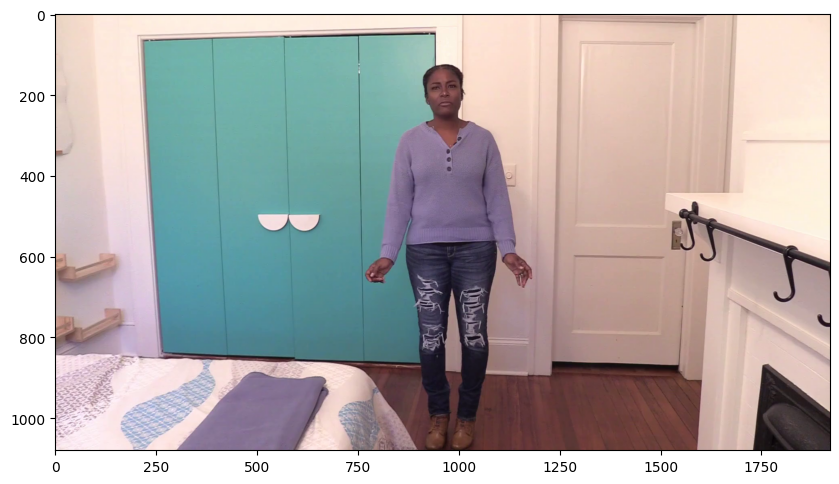

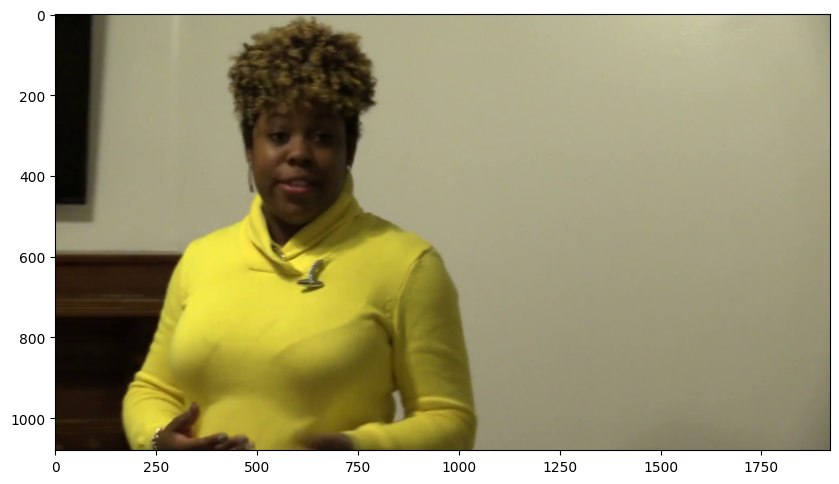

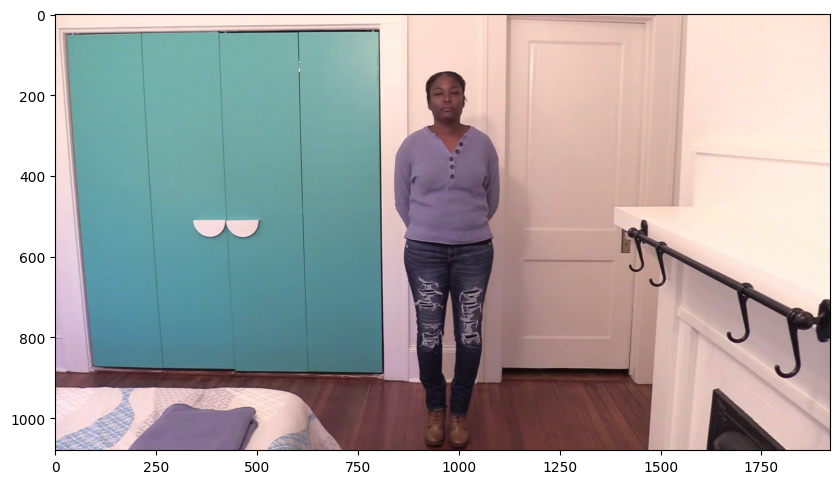

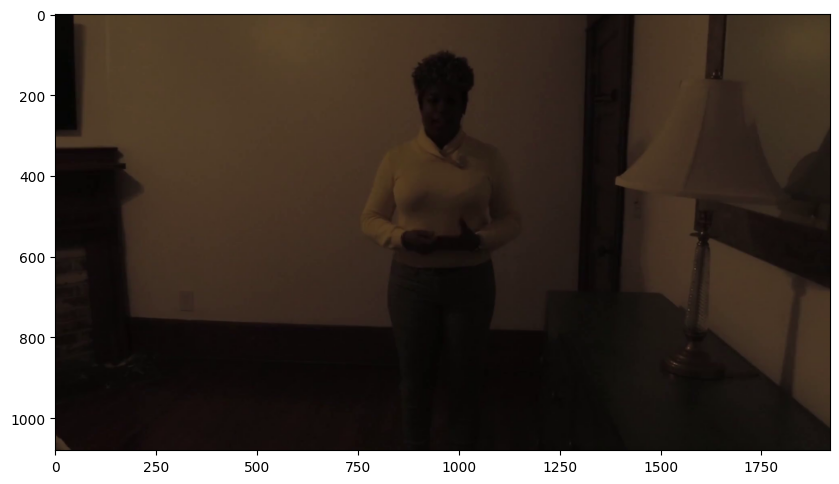

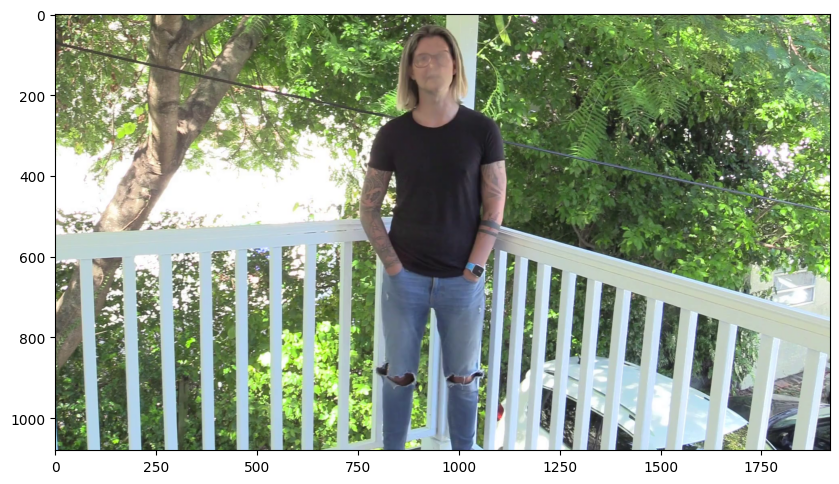

In [19]:
for video in fake_train_sample_video:
  display_image_from_video(os.path.join(r"C:\Users\menon\Codes\DeepFake_Detection\Dataset\train_sample_videos\\"+video))
  print()
  print()


## REAL Video Images

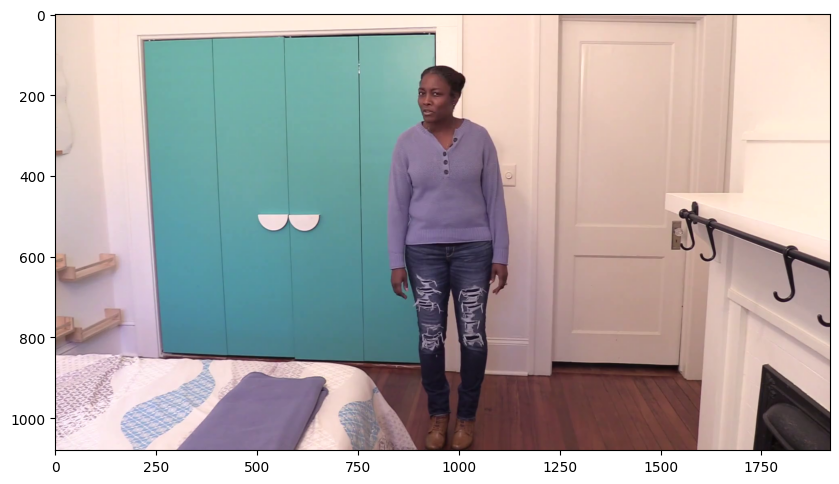

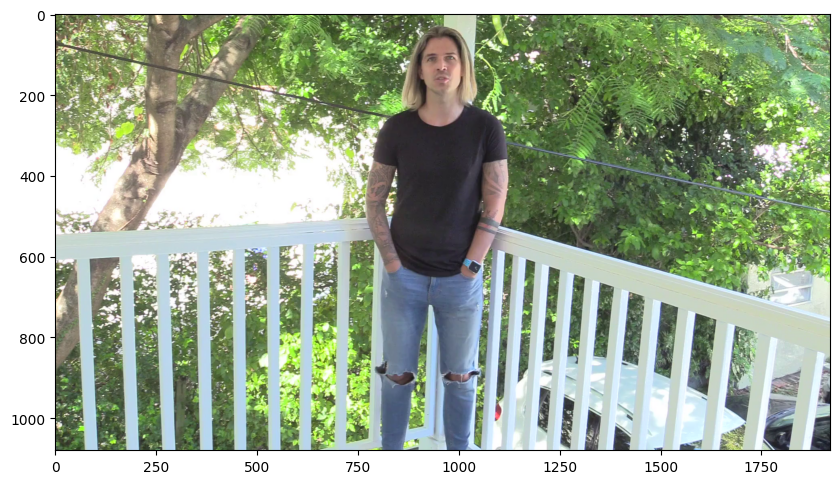

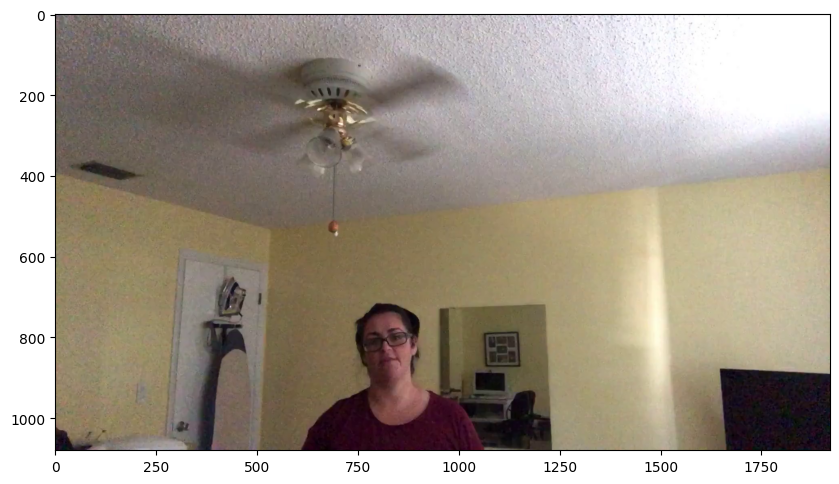

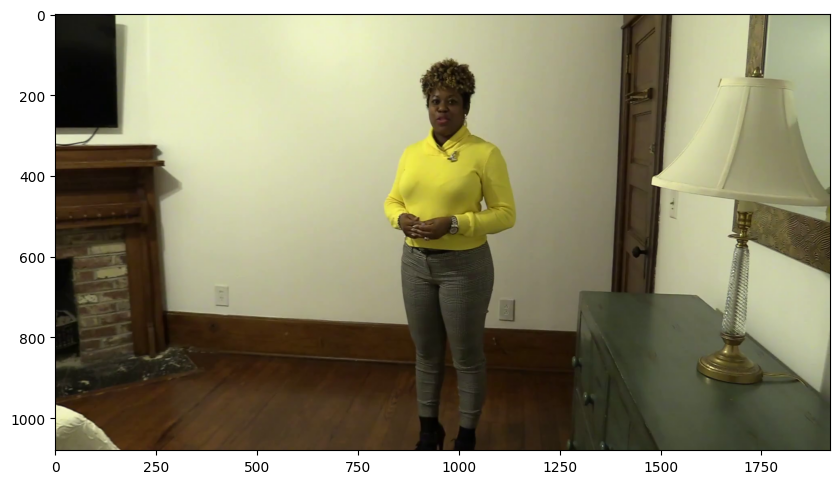

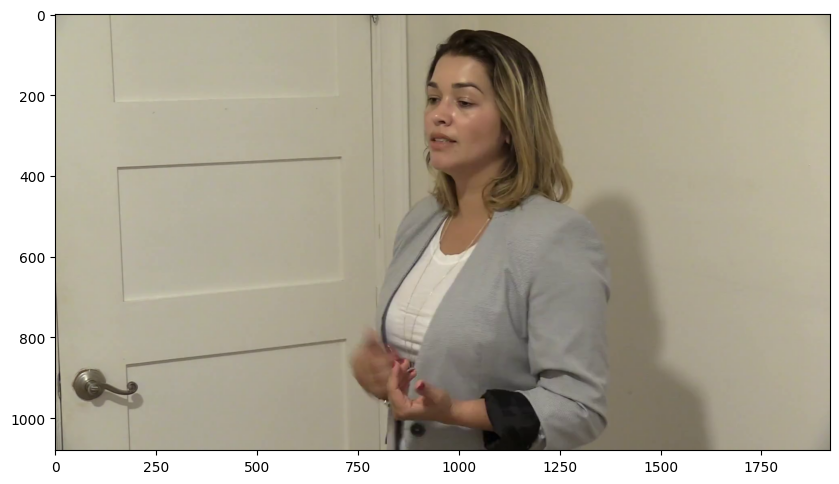

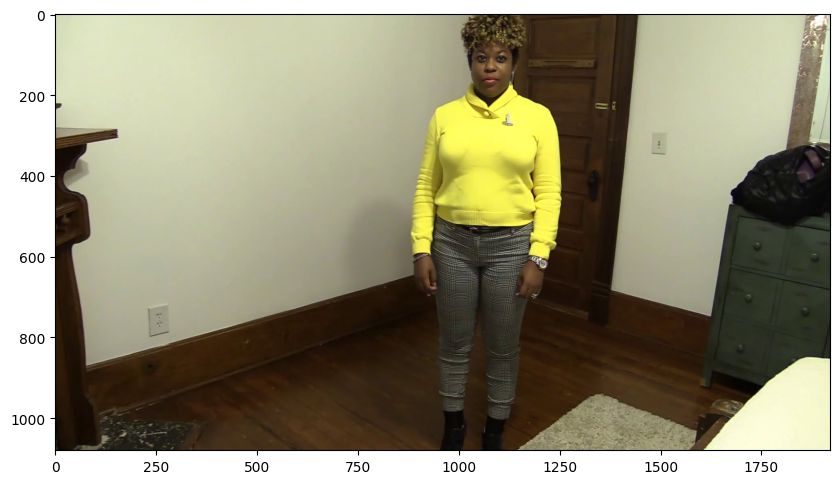

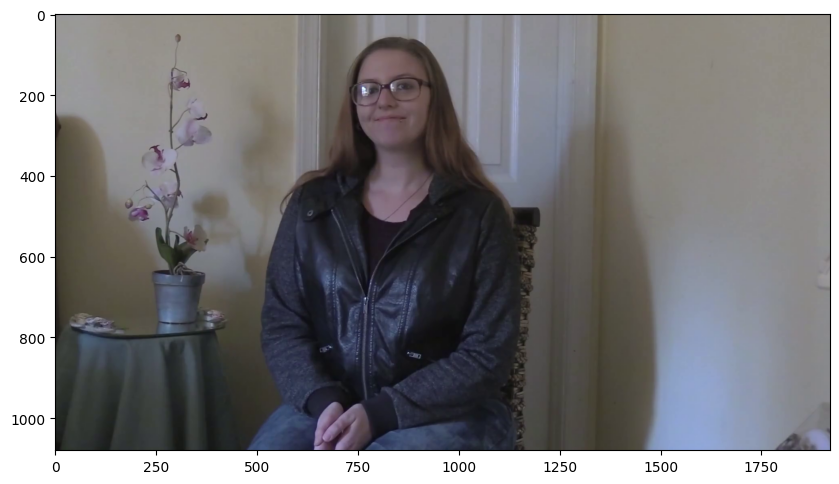

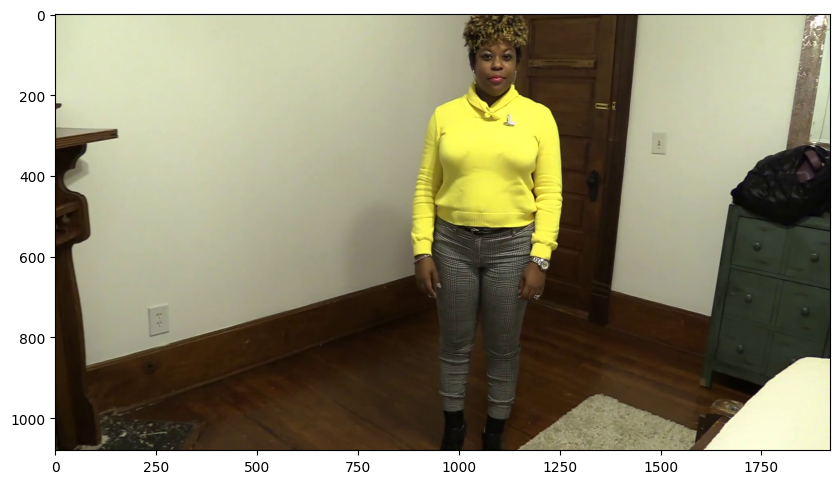

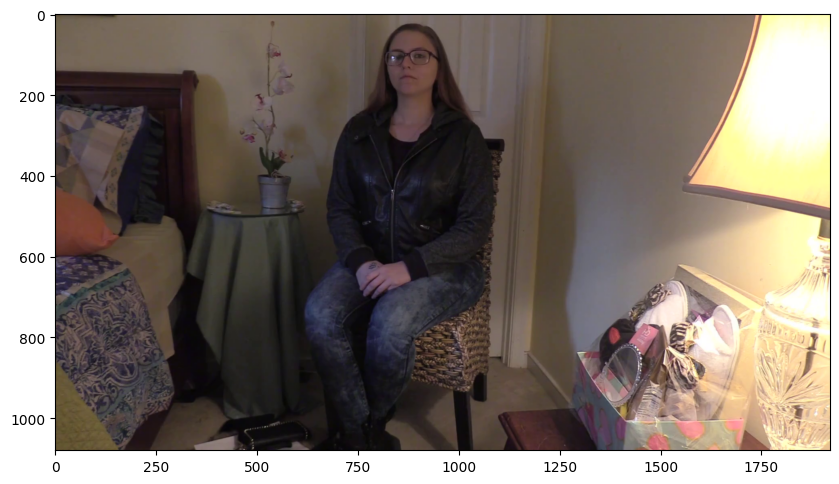

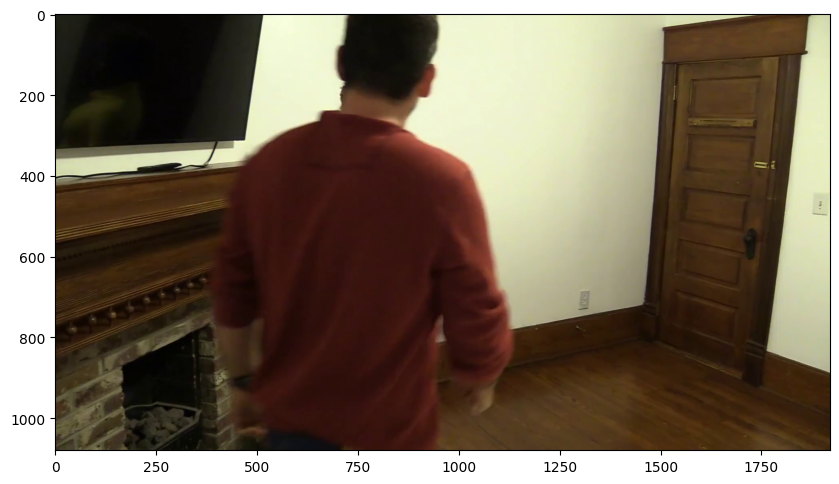

In [22]:
for video in real_train_sample_video:
  display_image_from_video(os.path.join(r"C:\Users\menon\Codes\DeepFake_Detection\Dataset\train_sample_videos\\"+video))
  print()
  print()

### Function to play the video

In [16]:
from IPython.display import HTML
from base64 import b64encode

def play_video(video_file):
    '''
    Display video
    param: video_file - the name of the video file to display
    param: subset - the folder where the video file is located (can be TRAIN_SAMPLE_FOLDER or TEST_Folder)
    '''
    video_url = open(video_file,'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(video_url).decode()
    return HTML("""<video width=500 controls><source src="%s" type="video/mp4"></video>""" % data_url)

In [17]:
play_video(r"C:\Users\menon\Codes\DeepFake_Detection\Dataset\train_sample_videos\aapnvogymq.mp4")

### Video in a Darkness

In [21]:
play_video(r"C:\Users\menon\Codes\DeepFake_Detection\Dataset\train_sample_videos\atvmxvwyns.mp4")

NameError: name 'play_video' is not defined

## Finding Average Frame rate of Videos

In [ ]:
videos = glob.glob('/content/drive/MyDrive/Dataset/train_sample_videos/*.mp4')
frame_cnt = []
for video in videos:
  capture = cv.VideoCapture(video)
  frame_cnt.append(int(capture.get(cv.CAP_PROP_FRAME_COUNT)))
print("Frames: ",frame_cnt)
print("Avg Frame per video: ",np.mean(frame_cnt))

Frames:  [300, 300, 300, 300, 300, 300, 300, 300, 300, 298, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 298, 298, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 298, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 298, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 298, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 

# Locating a Face within an Image

In [1]:
%pip install face_recognition

Note: you may need to restart the kernel to use updated packages.


In [2]:
def image_from_video(video_path):
    '''
    input: video_path - path for video
    process:
    1. perform a video capture from the video
    2. read the image
    3. display the image
    '''
    capture_image = cv.VideoCapture(video_path) 
    ret, frame = capture_image.read()
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111)
    frame = cv.cvtColor(frame, cv.COLOR_BGR2RGB)   # converting the frame color to RGB
    ax.imshow(frame)

    return frame

In [3]:
image = image_from_video(r"C:\Users\menon\Codes\DeepFake_Detection\Dataset\train_sample_videos\aagfhgtpmv.mp4")

NameError: name 'cv' is not defined

In [ ]:
import face_recognition

A face is located at pixel location Top: 217, Left: 365, Bottom: 440, Right: 588


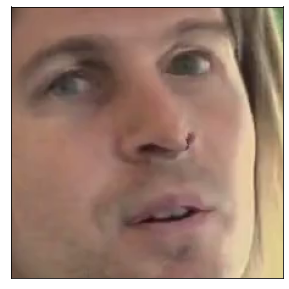

In [ ]:
face_locations = face_recognition.face_locations(image)

from PIL import Image


for face_location in face_locations:

  top,right,bottom,left = face_location
  print("A face is located at pixel location Top: {}, Left: {}, Bottom: {}, Right: {}".format(top, left, bottom, right))
  
  face_image = image[top:bottom, left:right]
  fig, ax = plt.subplots(1,1, figsize=(5, 5))
  plt.grid(False)
  ax.xaxis.set_visible(False)
  ax.yaxis.set_visible(False)
  ax.imshow(face_image)
